• carregando modelo…


2025-05-30 23:31:10.355132: I tensorflow/core/platform/cpu_feature_guard.cc:152] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE3 SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-30 23:31:10.595224: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 374 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:17:00.0, compute capability: 8.6


• carregando dados…
• inferindo…


2025-05-30 23:31:12.120749: I tensorflow/stream_executor/cuda/cuda_blas.cc:1804] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


  feito em 92.5 s  (900000 amostras)

=== Métricas absolutas (referência X) ===
  Canal real  : SNR =  14.14 dB | EVM = 19.644 %
  Modelo VAE  : SNR =  14.02 dB | EVM = 19.912 %
  Diferenças  : ΔSNR =  -0.12 dB | ΔEVM = +0.269 %


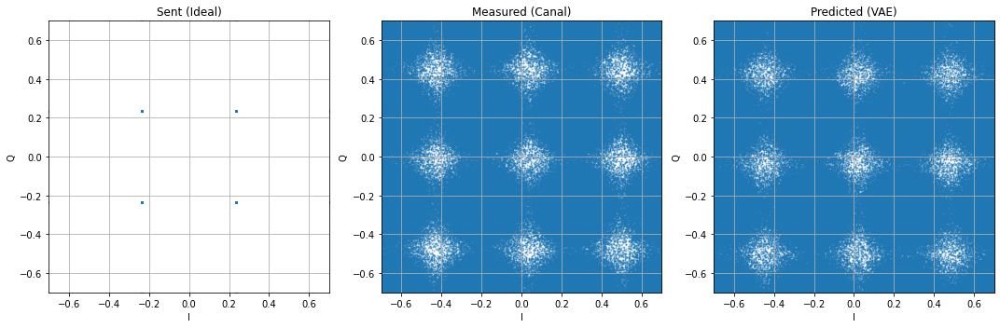

/tmp/ipykernel_784317/3840434257.py:99: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout(); plt.show()
/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


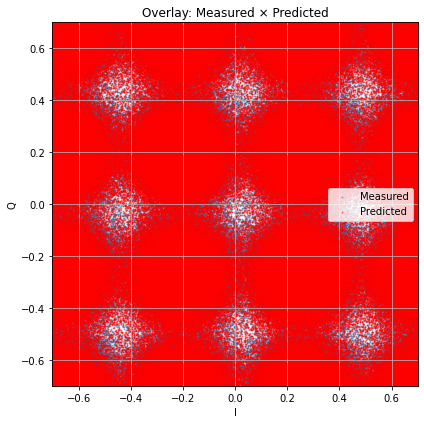

In [1]:
# -*- coding: utf-8 -*-
import os, time, math, numpy as np, tensorflow as tf
import matplotlib.pyplot as plt
import os

gpus = tf.config.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)


# ────────────────────────────────────────────────────────────────────
# 1) Caminhos
model_path = "/workspace/3-Saved_models/cvae_ruido_1"      # ajuste se mudou
data_dir   = "/workspace/1-Dataset(GNU_RADIO)/16QAM/IQ_data"

x_path = os.path.join(data_dir, "sent_data_tuple.npy")
y_path = os.path.join(data_dir, "received_data_tuple_sync-phase.npy")

batch_size = 12_000        # mesmo que usou no treino

# ────────────────────────────────────────────────────────────────────
# 2) Funções de métrica
def calculate_evm(ref, test):
    rc = ref[:,0] + 1j*ref[:,1]
    tc = test[:,0] + 1j*test[:,1]
    err = tc - rc
    evm  = np.sqrt(np.mean(np.abs(err)**2) / np.mean(np.abs(rc)**2))
    return evm*100.0, 20*np.log10(evm)

def calculate_snr(ref, test):
    rc = ref[:,0] + 1j*ref[:,1]
    tc = test[:,0] + 1j*test[:,1]
    noise = rc - tc
    snr = np.mean(np.abs(rc)**2) / np.mean(np.abs(noise)**2)
    return 10*np.log10(snr)

# ────────────────────────────────────────────────────────────────────
# 3) Loader & batch-inferência
def predict_in_batches(model, x, y_real, bs):
    """Model expects two inputs [x_in, y_tgt]."""
    preds = []
    n_batches = math.ceil(len(x) / bs)
    for i in range(n_batches):
        sl = slice(i*bs, (i+1)*bs)
        batch_pred = model.predict([x[sl], y_real[sl]], verbose=0)
        preds.append(batch_pred)
    return np.concatenate(preds, axis=0)

# ────────────────────────────────────────────────────────────────────
# 4) Rodar
print("• carregando modelo…")
vae = tf.keras.models.load_model(model_path, compile=False)

print("• carregando dados…")
X = np.load(x_path)
Y_real = np.load(y_path)

print("• inferindo…")
start = time.time()
Y_pred = predict_in_batches(vae, X, Y_real, batch_size)
print(f"  feito em {time.time()-start:.1f} s  ({len(X)} amostras)")

# ────────────────────────────────────────────────────────────────────
# 5) Métricas
evm_r_pct, evm_r_db = calculate_evm(X, Y_real)
evm_p_pct, evm_p_db = calculate_evm(X, Y_pred)
snr_r = calculate_snr(X, Y_real)
snr_p = calculate_snr(X, Y_pred)

print(f"\n=== Métricas absolutas (referência X) ===")
print(f"  Canal real  : SNR = {snr_r:6.2f} dB | EVM = {evm_r_pct:6.3f} %")
print(f"  Modelo VAE  : SNR = {snr_p:6.2f} dB | EVM = {evm_p_pct:6.3f} %")
print(f"  Diferenças  : ΔSNR = {snr_p-snr_r:+6.2f} dB | ΔEVM = {evm_p_pct-evm_r_pct:+6.3f} %")

# ────────────────────────────────────────────────────────────────────
# 6) Plot – constelações lado-a-lado + overlay
def to_complex(arr): return arr[:,0] + 1j*arr[:,1]
def plot_constellation(cmplx, ax, title, lim):
    ax.scatter(cmplx.real, cmplx.imag, s=1, alpha=0.4)
    ax.set_title(title); ax.grid(True)
    ax.set_xlim(lim); ax.set_ylim(lim); ax.set_xlabel('I'); ax.set_ylabel('Q')

lim = (-0.7, 0.7)

fig, axs = plt.subplots(1,3, figsize=(15,5))
plot_constellation(to_complex(X),       axs[0], "Sent (Ideal)",        lim)
plot_constellation(to_complex(Y_real),  axs[1], "Measured (Canal)",    lim)
plot_constellation(to_complex(Y_pred),  axs[2], "Predicted (VAE)",     lim)
plt.tight_layout(); plt.show()

# overlay
fig, ax = plt.subplots(figsize=(6,6))
ax.scatter(to_complex(Y_real).real,  to_complex(Y_real).imag,  s=1, alpha=0.4, label="Measured")
ax.scatter(to_complex(Y_pred).real,  to_complex(Y_pred).imag,  s=1, alpha=0.4, label="Predicted", color='red')
ax.set_xlim(lim); ax.set_ylim(lim); ax.grid(True)
ax.set_xlabel('I'); ax.set_ylabel('Q')
ax.set_title("Overlay: Measured × Predicted")
ax.legend()
plt.tight_layout(); plt.show()


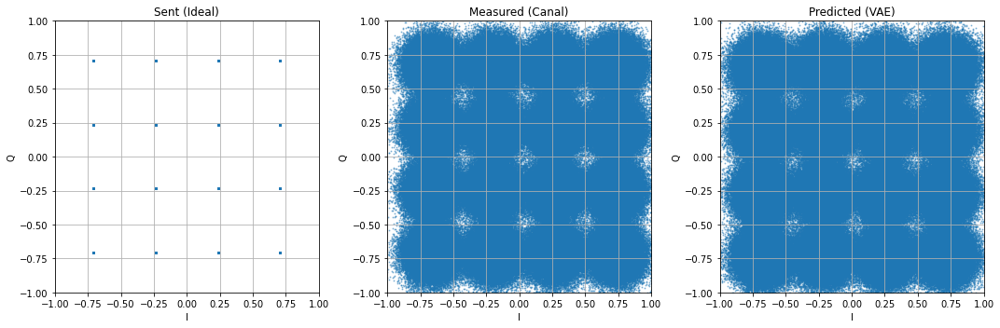

In [5]:
# 6) Plot – constelações lado-a-lado + overlay
def to_complex(arr): return arr[:,0] + 1j*arr[:,1]
def plot_constellation(cmplx, ax, title, lim):
    ax.scatter(cmplx.real, cmplx.imag, s=1, alpha=0.4)
    ax.set_title(title); ax.grid(True)
    ax.set_xlim(lim); ax.set_ylim(lim); ax.set_xlabel('I'); ax.set_ylabel('Q')

lim = (-1.0, 1.0)

fig, axs = plt.subplots(1,3, figsize=(15,5))
plot_constellation(to_complex(X),       axs[0], "Sent (Ideal)",        lim)
plot_constellation(to_complex(Y_real),  axs[1], "Measured (Canal)",    lim)
plot_constellation(to_complex(Y_pred),  axs[2], "Predicted (VAE)",     lim)
plt.tight_layout(); plt.show()


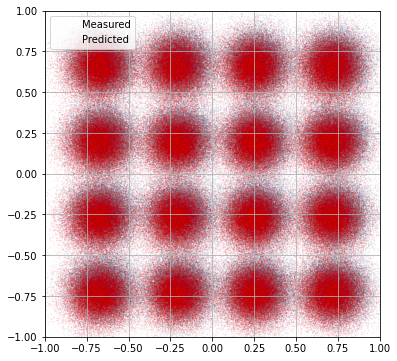

In [20]:
# ajuste limites e sample opcional
lim = (-1.0, 1.0)                # janela completa
n_plot = 500000                  # sub-amostrar para visual
idx = np.random.choice(len(X), n_plot, replace=False)

fig, ax = plt.subplots(figsize=(6,6))
ax.scatter(Y_real[idx,0], Y_real[idx,1], s=0.1, alpha=0.1, label="Measured")
ax.scatter(Y_pred[idx,0], Y_pred[idx,1], s=0.1, alpha=0.1, label="Predicted", color='red')
ax.set_xlim(lim); ax.set_ylim(lim); ax.grid(True); ax.legend()
plt.show()


In [8]:
def var_IQ(a): return np.var(a[:,0]) + np.var(a[:,1])
print("Var   real :", var_IQ(Y_real))
print("Var VAE    :", var_IQ(Y_pred))

# variância total (I+Q) – deve refletir SNR
var_real = np.var(Y_real[:,0]) + np.var(Y_real[:,1])
var_pred = np.var(Y_pred[:,0]) + np.var(Y_pred[:,1])
print(f"Var real  = {var_real:.5f}")
print(f"Var VAE   = {var_pred:.5f}   (+{100*(var_pred/var_real-1):.2f} %)")



Var   real : 0.553943
Var VAE    : 0.5570209
Var real  = 0.55394
Var VAE   = 0.55702   (+0.56 %)


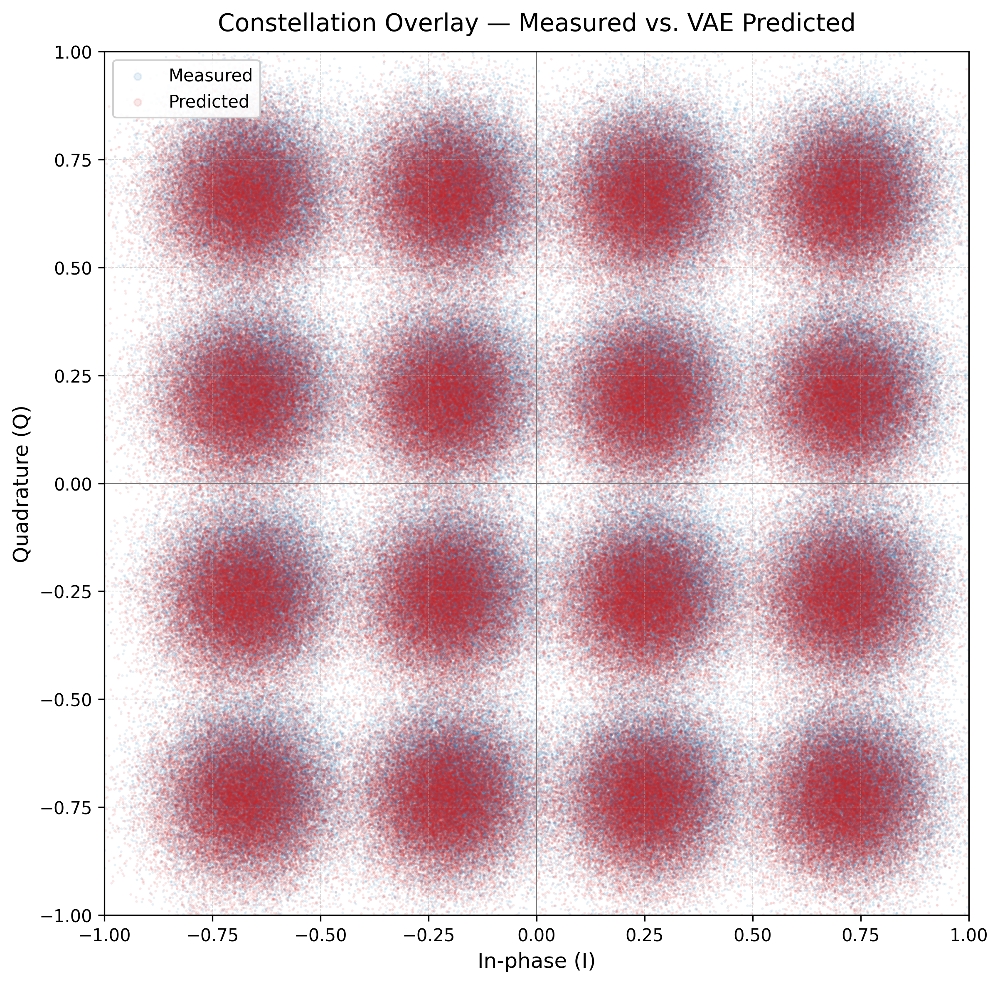

In [25]:
import matplotlib.pyplot as plt
import numpy as np

# --- Assumindo que X, Y_real, Y_pred já estão no namespace ------------
lim = (-1.0, 1.0)       # janela da constelação
n_plot = 500_000        # amostras a desenhar

# Sub‑amostragem reproducível (seed fixa)
rng = np.random.default_rng(1234)
idx = rng.choice(len(X), n_plot, replace=False)

# Figura detalhada
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
ax.scatter(Y_real[idx, 0], Y_real[idx, 1],
           s=0.25, alpha=0.1, label="Measured", color="#1f77b4")
ax.scatter(Y_pred[idx, 0], Y_pred[idx, 1],
           s=0.25, alpha=0.1, label="Predicted", color="#d62728")

# Estilo
ax.set_xlim(lim); ax.set_ylim(lim)
ax.set_aspect('equal', 'box')
ax.grid(True, linestyle='--', linewidth=0.4, alpha=0.5)
ax.set_xlabel('In‑phase (I)', fontsize=12)
ax.set_ylabel('Quadrature (Q)', fontsize=12)
ax.set_title('Constellation Overlay — Measured vs. VAE Predicted', fontsize=14, pad=12)
ax.legend(loc='upper left', markerscale=8, framealpha=0.9)

# Linhas centrais
ax.axhline(0, color='gray', linewidth=0.5)
ax.axvline(0, color='gray', linewidth=0.5)

plt.tight_layout()
# Salvar em alta resolução
fig.savefig("comparison_constellation.png", dpi=600, bbox_inches='tight')

plt.show()
